Preparation des données


In [1]:
import pandas as pd
df = pd.read_csv("allocinejpboxv4.csv")


In [4]:
df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10175 entries, 0 to 10174
Data columns (total 50 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              10175 non-null  int64  
 1   title                           10175 non-null  object 
 2   original_title                  3948 non-null   object 
 3   release_date                    10175 non-null  object 
 4   duration                        10175 non-null  float64
 5   genres                          10175 non-null  object 
 6   press_rating                    10175 non-null  float64
 7   audience_rating                 10175 non-null  float64
 8   director                        9808 non-null   object 
 9   writer                          9808 non-null   object 
 10  audience                        1492 non-null   object 
 11  distributor                     10175 non-null  object 
 12  movie_type                      

In [5]:
print(df.describe())


                 id      duration  press_rating  audience_rating  \
count  10175.000000  10175.000000  10175.000000     10175.000000   
mean    5088.000000    102.950049      3.067464         3.008576   
std     2937.413829     20.799016      0.641401         0.638668   
min        1.000000     24.000000      1.000000         0.800000   
25%     2544.500000     91.000000      2.700000         2.600000   
50%     5088.000000    100.000000      3.100000         3.008576   
75%     7631.500000    112.000000      3.500000         3.500000   
max    10175.000000    543.000000      5.000000         4.500000   

       box_office_fr  box_office_us       film_id  realisateur_id  \
count   1.017500e+04   1.017500e+04   5493.000000     1355.000000   
mean    1.276743e+05   5.676488e+06  13531.729838      526.479705   
std     2.848556e+05   1.705749e+07   7294.230587      284.166752   
min     0.000000e+00   0.000000e+00      7.000000       10.000000   
25%     2.131000e+03   0.000000e+00  10448

In [6]:
df.isnull().sum()


id                                   0
title                                0
original_title                    6227
release_date                         0
duration                             0
genres                               0
press_rating                         0
audience_rating                      0
director                           367
writer                             367
audience                          8683
distributor                          0
movie_type                           0
nationality                          7
languages                            0
synopsis                            40
actors                             150
box_office_fr                        0
box_office_us                        0
image_url                            0
film_id                           4682
realisateur_id                    8820
rang                              4682
titre_x                           4682
titre_vo                          8820
realisateur              

In [7]:
df.columns

Index(['id', 'title', 'original_title', 'release_date', 'duration', 'genres',
       'press_rating', 'audience_rating', 'director', 'writer', 'audience',
       'distributor', 'movie_type', 'nationality', 'languages', 'synopsis',
       'actors', 'box_office_fr', 'box_office_us', 'image_url', 'film_id',
       'realisateur_id', 'rang', 'titre_x', 'titre_vo', 'realisateur', 'genre',
       'annee', 'pays', 'entrees', 'salles', 'moy_salle', 'part_marche',
       'affiche', 'moyenne_fr_realisateur', 'sortie', 'distributeur',
       'classification', 'acteurs', 'moyennes_individuelles_acteurs',
       'acteurs principal', 'acteurs secondaires', 'max_moyenne',
       'moyennebestactors', 'Pays', 'cluster_realisateur',
       'cluster_acteur_principal', 'cluster_acteur_secondaire', 'titre_y',
       'budget'],
      dtype='object')

In [8]:
df = df.drop(columns=["titre_y", "id", "press_rating", "audience_rating", "synopsis", "titre_x", "titre_vo", "film_id", "affiche", "synopsis", "realisateur_id", "rang", "moy_salle", "part_marche", "image_url"])

In [9]:
df.columns

Index(['title', 'original_title', 'release_date', 'duration', 'genres',
       'director', 'writer', 'audience', 'distributor', 'movie_type',
       'nationality', 'languages', 'actors', 'box_office_fr', 'box_office_us',
       'realisateur', 'genre', 'annee', 'pays', 'entrees', 'salles',
       'moyenne_fr_realisateur', 'sortie', 'distributeur', 'classification',
       'acteurs', 'moyennes_individuelles_acteurs', 'acteurs principal',
       'acteurs secondaires', 'max_moyenne', 'moyennebestactors', 'Pays',
       'cluster_realisateur', 'cluster_acteur_principal',
       'cluster_acteur_secondaire', 'budget'],
      dtype='object')

In [10]:
# Suppression des lignes en place
df.drop(df[df['box_office_fr'] == 0.0].index, inplace=True)


In [11]:
df.shape[0]

9263

In [12]:
df.head(5)

,title,original_title,release_date,duration,genres,director,writer,audience,distributor,movie_type,...,moyennes_individuelles_acteurs,acteurs principal,acteurs secondaires,max_moyenne,moyennebestactors,Pays,cluster_realisateur,cluster_acteur_principal,cluster_acteur_secondaire,budget
0,Monsieur Constant,NaN,2025-05-28,108.000000,Comédie dramatique,alan simon,Alan Simon,NaN,Émotions Distribution,Long métrage,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Notes Laura Fiori,NaN,2025-04-15,75.000000,Drame,NaN,NaN,NaN,Cinéma Saint-André des Arts,Long métrage,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Trois contes,NaN,2025-04-14,102.950049,Animation,NaN,NaN,NaN,Diaphana Distribution,Long métrage,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
12,La Dame du jeu,NaN,2025-04-14,86.000000,Comédie dramatique,NaN,NaN,NaN,-,Long métrage,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
14,"Napoléon, 2ème partie",NaN,2025-04-14,102.950049,Divers,NaN,NaN,NaN,-,Long métrage,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [13]:
import pandas as pd

# Assurez-vous que "release date" est au format datetime et supprimez les heures
df['release_date'] = pd.to_datetime(df['release_date']).dt.date

# Définir les limites de date en format "date" (sans heures)
start_date = pd.to_datetime('2000-01-01').date()  # Début : janvier 2000 inclus
end_date = pd.to_datetime('2025-03-31').date()   # Fin : mars 2025 inclus

# Filtrer les lignes dans la plage de dates
df_filtered = df[(df['release_date'] >= start_date) & (df['release_date'] <= end_date)]

print(df_filtered)



                      title   original_title release_date  duration  \
53                     Anna              NaN   2025-03-05     118.0   
54                Black Dog         Gou Zhen   2025-03-05     110.0   
55      Le Secret de Khéops              NaN   2025-03-05      98.0   
56                Mickey 17              NaN   2025-03-05     137.0   
57                    Eject              NaN   2025-03-05     109.0   
...                     ...              ...          ...       ...   
10166           Chicken Run              NaN   2000-12-13      84.0   
10167             Dinosaure         Dinosaur   2000-11-29      82.0   
10168  In the Mood for Love  Fa yeung nin wa   2000-11-08      98.0   
10172    Le goût des autres              NaN   2000-03-01     112.0   
10174          Sixième Sens  The Sixth Sense   2000-01-05     107.0   

                                genres                      director  \
53                               Drame                  marco amenta   
54 

In [14]:
df_filtered.shape[0]

9254

In [15]:
df_filtered.head(5)

,title,original_title,release_date,duration,genres,director,writer,audience,distributor,movie_type,...,moyennes_individuelles_acteurs,acteurs principal,acteurs secondaires,max_moyenne,moyennebestactors,Pays,cluster_realisateur,cluster_acteur_principal,cluster_acteur_secondaire,budget
53,Anna,NaN,2025-03-05,118.0,Drame,marco amenta,"Marco Amenta,Anna Mittone",Tout public,Les Films de l'Atalante,Long métrage,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
54,Black Dog,Gou Zhen,2025-03-05,110.0,Drame,hu guan,"Hu Guan,Rui Ge",Tout public,Memento,Long métrage,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
55,Le Secret de Khéops,NaN,2025-03-05,98.0,Aventure,barbara schulz,"Barbara Schulz,Christophe Turpin",Tout public,SND,Long métrage,...,"[{'name': 'Fabrice Luchini', 'moyenne': 783947}]",Fabrice Luchini,NaN,783947.0,7.839470e+05,NaN,NaN,1,NaN,NaN
56,Mickey 17,NaN,2025-03-05,137.0,"Action,Comédie,""Science Fiction",bong joon ho,Bong Joon Ho,Tout public avec avertissement,Warner Bros. France,Long métrage,...,"[{'name': 'Robert Pattinson', 'moyenne': 19133...",Robert Pattinson,"Toni Collette, Mark Ruffalo",1913382.0,1.216790e+06,NaN,NaN,2,"0, 1",NaN
57,Eject,NaN,2025-03-05,109.0,Drame,tiburce,Tiburce,NaN,Thaumatrope Film Association - CFA Programmation,Long métrage,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [16]:
# Filtrer pour ne conserver que les lignes où 'max_moyenne' n'est pas vide (non-NaN)
df = df_filtered[df_filtered['max_moyenne'].notna()]


In [17]:
df.shape[0]

3583

In [18]:
df.to_csv('xgboost.csv', index=False)

In [19]:
df.head(10)

,title,original_title,release_date,duration,genres,director,writer,audience,distributor,movie_type,...,moyennes_individuelles_acteurs,acteurs principal,acteurs secondaires,max_moyenne,moyennebestactors,Pays,cluster_realisateur,cluster_acteur_principal,cluster_acteur_secondaire,budget
55,Le Secret de Khéops,NaN,2025-03-05,98.0,Aventure,barbara schulz,"Barbara Schulz,Christophe Turpin",Tout public,SND,Long métrage,...,"[{'name': 'Fabrice Luchini', 'moyenne': 783947}]",Fabrice Luchini,NaN,783947.0,7.839470e+05,NaN,NaN,1,NaN,NaN
56,Mickey 17,NaN,2025-03-05,137.0,"Action,Comédie,""Science Fiction",bong joon ho,Bong Joon Ho,Tout public avec avertissement,Warner Bros. France,Long métrage,...,"[{'name': 'Robert Pattinson', 'moyenne': 19133...",Robert Pattinson,"Toni Collette, Mark Ruffalo",1913382.0,1.216790e+06,NaN,NaN,2,"0, 1",NaN
58,In The Lost Lands,NaN,2025-03-05,101.0,"Action,Aventure,Fantastique",paul w.s. anderson,"Paul W.S. Anderson,Constantin Werner",Interdit - 12 ans,Metropolitan FilmExport,Long métrage,...,"[{'name': 'Milla Jovovich', 'moyenne': 778222}]",Milla Jovovich,NaN,778222.0,7.782220e+05,Canada,1.0,1,NaN,NaN
68,A Real Pain,NaN,2025-02-26,89.0,Comédie dramatique,jesse eisenberg,Jesse Eisenberg,Tout public,The Walt Disney Company France,Long métrage,...,"[{'name': 'Jesse Eisenberg', 'moyenne': 792849}]",Jesse Eisenberg,NaN,792849.0,7.928490e+05,Etats-Unis,NaN,1,NaN,3000000.0
69,Queer,NaN,2025-02-26,136.0,Comédie dramatique,luca guadagnino,Justin Kuritzkes,Interdit - 12 ans avec avertissement,Pan Distribution,Long métrage,...,"[{'name': 'Daniel Craig', 'moyenne': 1176613}]",Daniel Craig,NaN,1176613.0,1.176613e+06,Etats-Unis,NaN,0,NaN,48000000.0
74,The Monkey,NaN,2025-02-19,98.0,"Comédie,Epouvante-horreur",osgood perkins,Osgood Perkins,Interdit - 12 ans,Metropolitan FilmExport,Long métrage,...,"[{'name': 'Elijah Wood', 'moyenne': 1225316}]",Elijah Wood,NaN,1225316.0,1.225316e+06,Etats-Unis,NaN,0,NaN,NaN
75,Mercato,NaN,2025-02-19,119.0,"Comédie dramatique"",Thriller",tristan séguéla,"Olivier Demangel,Thomas Finkielkraut",Tout public,Pathé Films,Long métrage,...,"[{'name': 'Jamel Debbouze', 'moyenne': 2206954}]",Jamel Debbouze,NaN,2206954.0,2.206954e+06,France,NaN,2,NaN,NaN
80,Dis-moi juste que tu m'aimes,NaN,2025-02-19,111.0,Drame,anne le ny,Anne Le Ny,Tout public,SND,Long métrage,...,"[{'name': 'Elodie Bouchez', 'moyenne': 480544}...","Elodie Bouchez, José Garcia, Vanessa Paradis, ...",NaN,1790053.0,1.156922e+06,France,NaN,"0, 1, 2",NaN,NaN
83,Bridget Jones : folle de lui,Bridget Jones: Mad About the Boy,2025-02-12,124.0,"Comédie,Romance",michael morris,"Helen Fielding,Abi Morgan",Tout public,StudioCanal,Long métrage,...,"[{'name': 'Renee Zellweger', 'moyenne': 575165...",Renee Zellweger,"Colin Firth, Hugh Grant, Emma Thompson",990806.0,9.012037e+05,Grande-Bretagne,NaN,1,"0, 1",NaN
87,The Brutalist,NaN,2025-02-12,214.0,Drame,brady corbet,"Brady Corbet,Mona Fastvold",Tout public avec avertissement,Universal Pictures International France,Long métrage,...,"[{'name': 'Adrien Brody', 'moyenne': 609366}, ...","Adrien Brody, Guy Pearce",NaN,762495.0,6.859305e+05,Grande-Bretagne,NaN,1,NaN,9600000.0


In [20]:
df_budget = df[df['budget'].notna()]
df_budget.shape[0]


1779

In [21]:
# Compter le nombre de réalisateurs différents dans la colonne 'director'
nombre_directeurs_uniques = df['director'].nunique()

print(f"Nombre de réalisateurs différents : {nombre_directeurs_uniques}")


Nombre de réalisateurs différents : 1983


In [22]:
nombre_de_distributeurs_uniques = df['distributeur'].nunique()
print(f"Nombre de distributeurs différents : {nombre_de_distributeurs_uniques}")

Nombre de distributeurs différents : 105


In [23]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from xgboost import XGBRegressor, XGBClassifier  # selon si c'est une régression ou classification
import matplotlib.pyplot as plt
import seaborn as sns


In [24]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from xgboost import XGBRegressor  # puisque nous allons prédire "box_office_fr" (régression)
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt
import seaborn as sns

# Charger le dataset
data = pd.read_csv("xgboost.csv")  # remplacez par le chemin vers votre fichier


In [25]:
# Après avoir filtré pour conserver uniquement les colonnes utiles
colonnes_utiles = [
    'title', 
    'release_date', 
    'duration', 
    'distributor', 
    'movie_type', 
    'languages', 
    'audience', 
    'Pays', 
    'max_moyenne', 
    'cluster_acteur_principal', 
    'budget',
    'box_office_fr'
]
data = data[colonnes_utiles].copy()  # Création d'une copie explicite du DataFrame



In [26]:
data["release_date"] = pd.to_datetime(data["release_date"], errors='coerce')
data["release_year"] = data["release_date"].dt.year
data["release_month"] = data["release_date"].dt.month
data["release_day"] = data["release_date"].dt.day
data.drop(columns=["release_date"], inplace=True)


In [27]:
# Remplir les valeurs manquantes par la médiane pour les variables numériques
numeric_cols = ["duration", "max_moyenne", "budget"]
for col in numeric_cols:
    data[col].fillna(data[col].median(), inplace=True)


/tmp/ipykernel_4030/3761907794.py:4: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  data[col].fillna(data[col].median(), inplace=True)
/tmp/ipykernel_4030/3761907794.py:4: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', tr

In [28]:
# Ajouter "audience" à la liste des features catégorielles
categorical_features = ["distributor", "movie_type", "languages", "Pays", "cluster_acteur_principal", "audience"]

# Encodage One-Hot de toutes ces colonnes et suppression de la première modalité pour éviter la redondance
data = pd.get_dummies(data, columns=categorical_features, drop_first=True)


In [29]:
# Supposons que nous utilisons maintenant toutes les colonnes préparées sauf "box_office_fr" (et éventuellement "title")
X = data.drop(columns=["box_office_fr", "title"])  # on peut supprimer "title" si on a extrait "title_length"
y = data["box_office_fr"]

import numpy as np


y = np.log1p(y)  # Utilisation de log1p pour gérer les valeurs proches de 0



In [30]:
from xgboost import XGBRegressor

model = XGBRegressor(
    objective='reg:squarederror',
    n_estimators=100,
    learning_rate=0.1,
    random_state=42
)


In [31]:
print(X.dtypes)
print("Colonnes de type object :", X.select_dtypes(include=["object"]).columns.tolist())


duration                                         float64
max_moyenne                                      float64
budget                                           float64
release_year                                       int32
release_month                                      int32
                                                  ...   
audience_Interdit - 16 ans                          bool
audience_Interdit - 16 ans avec avertissement       bool
audience_Interdit - 18 ans                          bool
audience_Tout public                                bool
audience_Tout public avec avertissement             bool
Length: 435, dtype: object
Colonnes de type object : []


In [32]:
from sklearn.model_selection import KFold, cross_val_score
import numpy as np

# Définir 5 folds en mélangeant les données
cv = KFold(n_splits=5, shuffle=True, random_state=42)

# Utiliser cross_val_score pour obtenir les scores négatifs de MSE
scores = cross_val_score(model, X, y, scoring="neg_mean_squared_error", cv=cv)

print("Scores négatifs de MSE pour chaque fold :", scores)
print("Score MSE moyen :", -np.mean(scores))
print("RMSE moyen :", np.sqrt(-np.mean(scores)))


Scores négatifs de MSE pour chaque fold : [-1.41410381 -1.59045562 -1.38403622 -1.3109855  -1.36215959]
Score MSE moyen : 1.4123481486725917
RMSE moyen : 1.1884225463498208


count    3583.000000
mean       11.499255
std         1.518856
min         3.713572
25%        10.761407
50%        11.677728
75%        12.483453
max        15.047042
Name: box_office_fr, dtype: float64


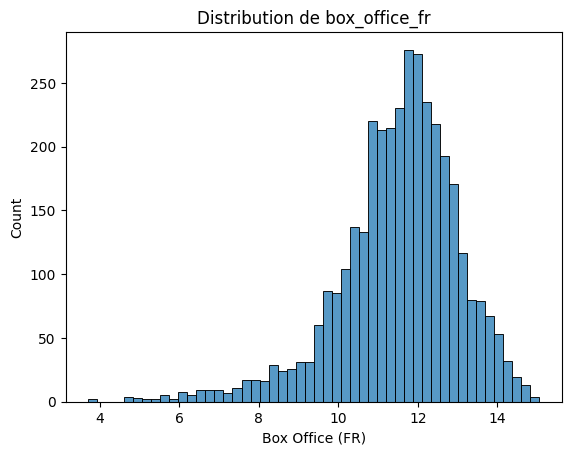

In [33]:
import matplotlib.pyplot as plt
import seaborn as sns

print(y.describe())
sns.histplot(y, bins=50)
plt.xlabel("Box Office (FR)")
plt.title("Distribution de box_office_fr")
plt.show()


In [34]:
from sklearn.model_selection import train_test_split

# Séparer les données en ensemble d'entraînement (80 %) et de test (20 %)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


In [35]:
model.fit(X_train, y_train)


XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             feature_weights=None, gamma=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=0.1, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
             max_leaves=None, min_child_weight=None, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=100,
             n_jobs=None, num_parallel_tree=None, ...)

In [ ]:
# Prédictions sur l'échelle logarithmique
predictions_log = model.predict(X_test)

# Inverser la transformation logarithmique pour revenir à l'échelle originale
predictions_original = np.expm1(predictions_log)


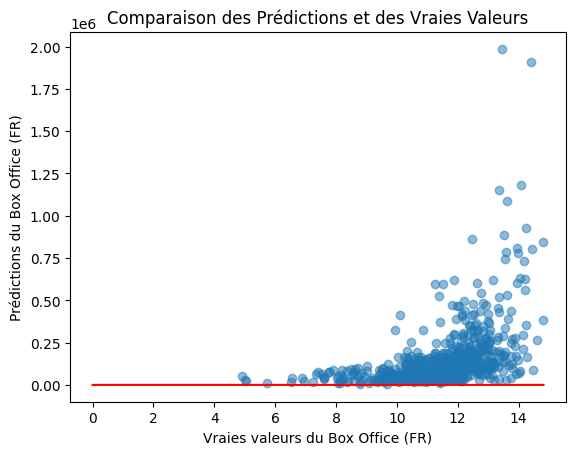

In [37]:
import matplotlib.pyplot as plt

plt.scatter(y_test, predictions_original, alpha=0.5)
plt.xlabel("Vraies valeurs du Box Office (FR)")
plt.ylabel("Prédictions du Box Office (FR)")
plt.title("Comparaison des Prédictions et des Vraies Valeurs")
plt.plot([0, max(y_test)], [0, max(y_test)], color='red')  # Ligne de référence y=x
plt.show()


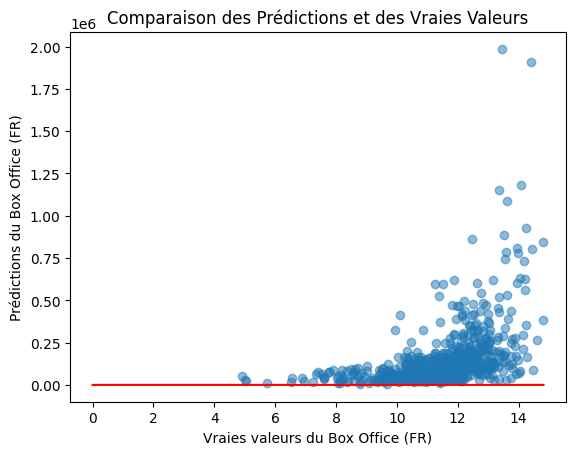

In [38]:
import matplotlib.pyplot as plt

# Prédictions inversées (revenir à l'échelle originale)
predictions_log = model.predict(X_test)
predictions_original = np.expm1(predictions_log)

# Comparaison entre les vraies valeurs et les prédictions
plt.scatter(y_test, predictions_original, alpha=0.5)
plt.xlabel("Vraies valeurs du Box Office (FR)")
plt.ylabel("Prédictions du Box Office (FR)")
plt.title("Comparaison des Prédictions et des Vraies Valeurs")
plt.plot([0, max(y_test)], [0, max(y_test)], color='red')  # Ligne y=x pour référence
plt.show()


In [39]:
import matplotlib.pyplot as plt
import seaborn as sns

# Calculer les erreurs
errors = y_test - predictions

sns.histplot(errors, bins=50, kde=True)
plt.xlabel("Erreur (Box Office réel - Prédiction)")
plt.title("Distribution des Erreurs")
plt.show()


NameError: name 'predictions' is not defined

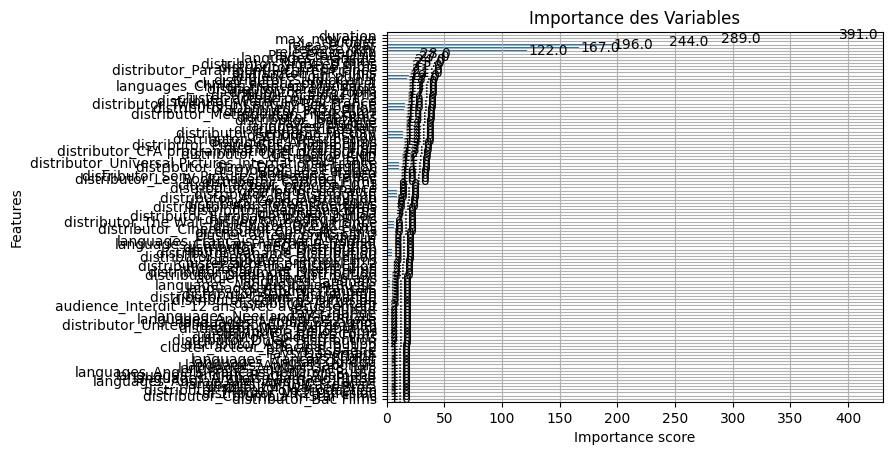

In [ ]:
from xgboost import plot_importance

plot_importance(model)
plt.title("Importance des Variables")
plt.show()


/home/maxime/DataDevIA/predictioncinema/popularity_movie_prediction_project/ML/.venv/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


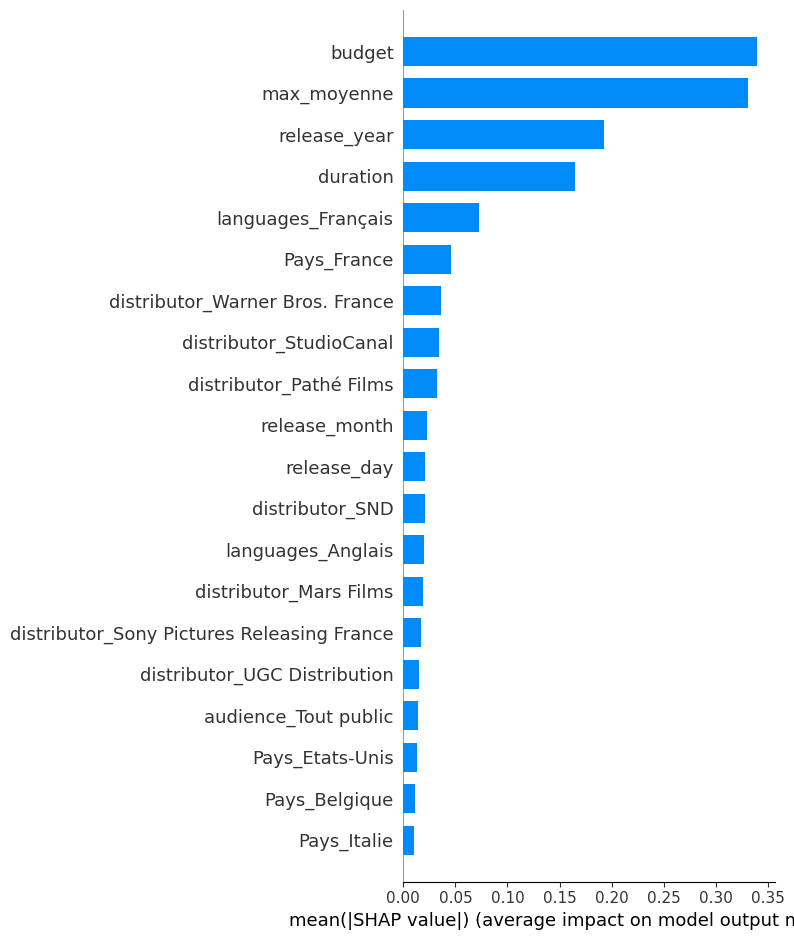

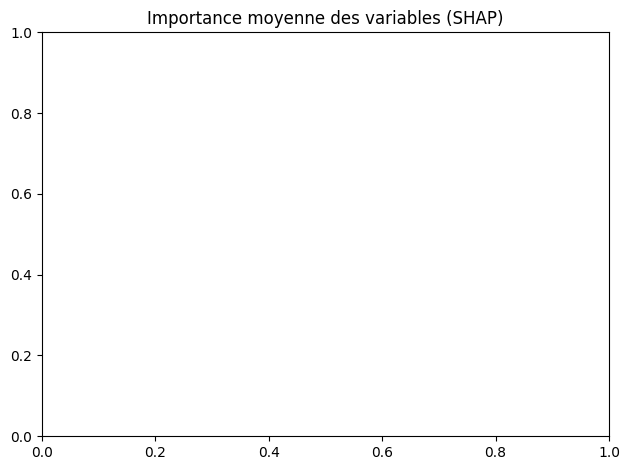

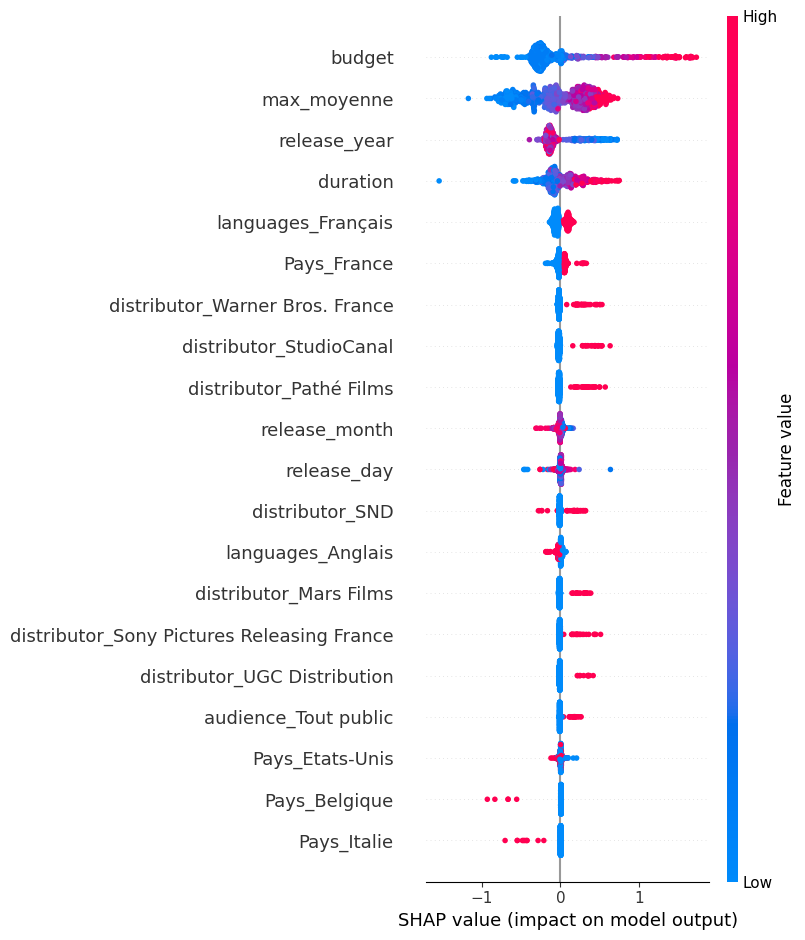

In [ ]:
import shap
import matplotlib.pyplot as plt

# 1. Créer l'explainer SHAP pour votre modèle XGBoost
explainer = shap.TreeExplainer(model)

# 2. Calculer les valeurs SHAP sur l'ensemble des données de test
shap_values = explainer.shap_values(X_test)

# 3. Visualiser l'importance moyenne des variables avec un summary plot de type bar
shap.summary_plot(shap_values, X_test, plot_type="bar")
plt.title("Importance moyenne des variables (SHAP)")
plt.tight_layout()
plt.show()

# 4. Visualiser la distribution des impacts SHAP avec un summary plot (beeswarm)
shap.summary_plot(shap_values, X_test)


Version en retenant seulement les films avec cluster realisateur present


In [40]:
import pandas as pd

# Charger le fichier CSV
df = pd.read_csv("xgboost.csv")

# Filtrer les lignes où 'cluster_realisateur' contient une valeur (non null et non NaN)
filtered_df = df[df['cluster_realisateur'].notna()]

# Sauvegarder le fichier filtré
filtered_df.to_csv("xgboostavecreal.csv", index=False)

print("Le fichier filtré a été sauvegardé sous le nom 'xgboost_filtered.csv'.")


Le fichier filtré a été sauvegardé sous le nom 'xgboost_filtered.csv'.


In [2]:
import pandas as pd

# Charger le fichier CSV
df = pd.read_csv("xgboost.csv")

# Filtrer les lignes où 'entree' est supérieure à 80000
filtered_df = df[df['entrees'] > 80000]

# Sauvegarder le fichier filtré
filtered_df.to_csv("xgboost80000.csv", index=False)

print("Le fichier filtré a été sauvegardé sous le nom 'xgboost_filtered.csv'.")


Le fichier filtré a été sauvegardé sous le nom 'xgboost_filtered.csv'.


In [22]:
import pandas as pd
df = pd.read_csv("xgboost80000.csv")

In [23]:
df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2272 entries, 0 to 2271
Data columns (total 36 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   title                           2272 non-null   object 
 1   original_title                  782 non-null    object 
 2   release_date                    2272 non-null   object 
 3   duration                        2272 non-null   float64
 4   genres                          2272 non-null   object 
 5   director                        2257 non-null   object 
 6   writer                          2257 non-null   object 
 7   audience                        352 non-null    object 
 8   distributor                     2272 non-null   object 
 9   movie_type                      2272 non-null   object 
 10  nationality                     2272 non-null   object 
 11  languages                       2272 non-null   object 
 12  actors                          22

In [24]:
df.describe()

,duration,box_office_fr,box_office_us,annee,entrees,salles,moyenne_fr_realisateur,max_moyenne,moyennebestactors,cluster_realisateur,budget
count,2272.000000,2.272000e+03,2.272000e+03,2272.000000,2.272000e+03,2272.000000,9.750000e+02,2.272000e+03,2.272000e+03,975.000000,1.344000e+03
mean,108.107394,3.416824e+05,1.379807e+07,2012.293574,3.589266e+05,384.510563,1.187650e+06,1.114017e+06,9.219136e+05,1.228718,4.662443e+07
std,18.080448,3.825121e+05,2.770633e+07,6.583314,3.949572e+05,180.594717,9.503215e+05,4.957176e+05,3.772459e+05,0.554981,5.718329e+07
min,67.000000,4.600000e+01,0.000000e+00,2000.000000,8.002800e+04,0.000000,8.322100e+04,1.605010e+05,1.605010e+05,0.000000,1.200000e+06
25%,95.000000,1.256375e+05,0.000000e+00,2007.000000,1.339368e+05,244.000000,5.534440e+05,7.697130e+05,6.805159e+05,1.000000,7.810990e+06
50%,105.000000,2.045320e+05,2.090000e+05,2012.000000,2.147960e+05,348.000000,9.028070e+05,1.025955e+06,8.556575e+05,1.000000,2.000000e+07
75%,118.000000,3.901540e+05,1.700000e+07,2017.000000,4.085545e+05,500.000000,1.599581e+06,1.348486e+06,1.096923e+06,2.000000,6.500000e+07
max,214.000000,3.426471e+06,3.571150e+08,2025.000000,4.378720e+06,1036.000000,6.579581e+06,3.679078e+06,3.679078e+06,2.000000,3.560000e+08


In [25]:
df.isnull().sum()

title                                0
original_title                    1490
release_date                         0
duration                             0
genres                               0
director                            15
writer                              15
audience                          1920
distributor                          0
movie_type                           0
nationality                          0
languages                            0
actors                               0
box_office_fr                        0
box_office_us                        0
realisateur                       1300
genre                                0
annee                                0
pays                                 0
entrees                              0
salles                               0
moyenne_fr_realisateur            1297
sortie                               0
distributeur                         0
classification                     484
acteurs                  

In [26]:
df.columns

Index(['title', 'original_title', 'release_date', 'duration', 'genres',
       'director', 'writer', 'audience', 'distributor', 'movie_type',
       'nationality', 'languages', 'actors', 'box_office_fr', 'box_office_us',
       'realisateur', 'genre', 'annee', 'pays', 'entrees', 'salles',
       'moyenne_fr_realisateur', 'sortie', 'distributeur', 'classification',
       'acteurs', 'moyennes_individuelles_acteurs', 'acteurs principal',
       'acteurs secondaires', 'max_moyenne', 'moyennebestactors', 'Pays',
       'cluster_realisateur', 'cluster_acteur_principal',
       'cluster_acteur_secondaire', 'budget'],
      dtype='object')

In [27]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from xgboost import XGBRegressor  # puisque nous allons prédire "box_office_fr" (régression)
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt
import seaborn as sns

# Charger le dataset
data = pd.read_csv("xgboost80000.csv")  # remplacez par le chemin vers votre fichier


In [28]:
# Après avoir filtré pour conserver uniquement les colonnes utiles
colonnes_utiles = [
    'release_date', 
    'duration',
    "realisateur",
    'distributor', 
    'movie_type', 
    'languages', 
    'audience', 
    'Pays', 
    'max_moyenne', 
    'cluster_acteur_principal', 
    'budget',
    'box_office_fr'
]
data = data[colonnes_utiles].copy()  # Création d'une copie explicite du DataFrame

In [29]:
data["release_date"] = pd.to_datetime(data["release_date"], errors='coerce')
data["release_year"] = data["release_date"].dt.year
data["release_month"] = data["release_date"].dt.month
data["release_day"] = data["release_date"].dt.day
data.drop(columns=["release_date"], inplace=True)


In [30]:
# Remplir les valeurs manquantes par la médiane pour les variables numériques
numeric_cols = ["duration", "max_moyenne", "budget"]
for col in numeric_cols:
    data[col].fillna(data[col].median(), inplace=True)


/tmp/ipykernel_45920/3761907794.py:4: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  data[col].fillna(data[col].median(), inplace=True)
/tmp/ipykernel_45920/3761907794.py:4: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', 

In [54]:
df['realisateur'] = df['realisateur'].astype('category')

In [31]:
categorical_features = ["distributor", "movie_type", "languages", "Pays", "cluster_acteur_principal", "audience", "realisateur"]

# Encodage One-Hot de toutes ces colonnes et suppression de la première modalité pour éviter la redondance
data = pd.get_dummies(data, columns=categorical_features, drop_first=True)


In [32]:
# Supposons que nous utilisons maintenant toutes les colonnes préparées sauf "box_office_fr" (et éventuellement "title")
X = data.drop(columns=["box_office_fr"])  # on peut supprimer "title" si on a extrait "title_length"
y = data["box_office_fr"]

import numpy as np


y = np.log1p(y)  # Utilisation de log1p pour gérer les valeurs proches de 0


In [ ]:
from xgboost import XGBRegressor

model = XGBRegressor(
    objective='reg:squarederror',
    n_estimators=100,
    learning_rate=0.1,
    random_state=42
)




In [34]:
print(X.dtypes)
print("Colonnes de type object :", X.select_dtypes(include=["object"]).columns.tolist())


duration                      float64
max_moyenne                   float64
budget                        float64
release_year                    int32
release_month                   int32
                               ...   
realisateur_Xavier Dolan         bool
realisateur_Yvan Attal           bool
realisateur_Zabou Breitman       bool
realisateur_Zack Snyder          bool
realisateur_Zhang Yimou          bool
Length: 586, dtype: object
Colonnes de type object : []


In [35]:
from sklearn.model_selection import KFold, cross_val_score
import numpy as np

# Définir 5 folds en mélangeant les données
cv = KFold(n_splits=5, shuffle=True, random_state=42)

# Utiliser cross_val_score pour obtenir les scores négatifs de MSE
scores = cross_val_score(model, X, y, scoring="neg_mean_squared_error", cv=cv)

print("Scores négatifs de MSE pour chaque fold :", scores)
print("Score MSE moyen :", -np.mean(scores))
print("RMSE moyen :", np.sqrt(-np.mean(scores)))


Scores négatifs de MSE pour chaque fold : [-0.67754728 -0.83286637 -0.50645141 -0.97935144 -0.85059094]
Score MSE moyen : 0.7693614897826037
RMSE moyen : 0.877132538321663


count    2272.000000
mean       12.300555
std         1.019485
min         3.850148
25%        11.741164
50%        12.228484
75%        12.874299
max        15.047042
Name: box_office_fr, dtype: float64


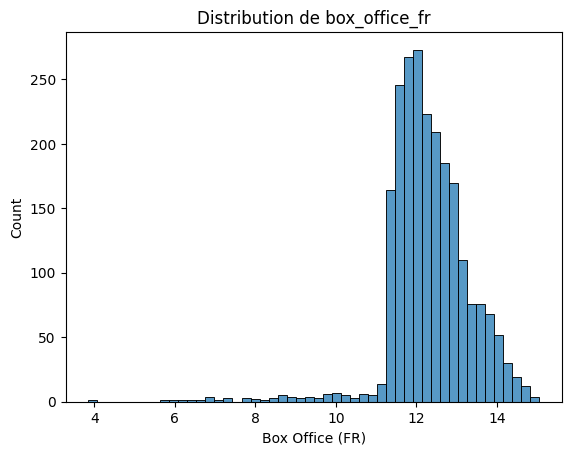

In [36]:
import matplotlib.pyplot as plt
import seaborn as sns

print(y.describe())
sns.histplot(y, bins=50)
plt.xlabel("Box Office (FR)")
plt.title("Distribution de box_office_fr")
plt.show()


In [37]:
from sklearn.model_selection import train_test_split

# Séparer les données en ensemble d'entraînement (90 %) et de test (10 %)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42)


In [38]:
model.fit(X_train, y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             feature_weights=None, gamma=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=0.1, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
             max_leaves=None, min_child_weight=None, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=100,
             n_jobs=None, num_parallel_tree=None, ...)

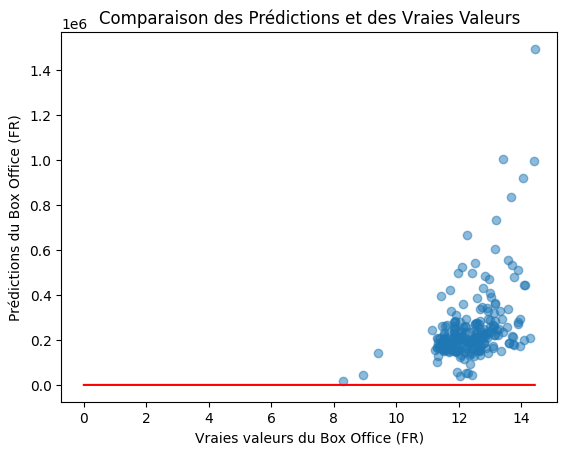

In [41]:
import matplotlib.pyplot as plt

plt.scatter(y_test, predictions_original, alpha=0.5)
plt.xlabel("Vraies valeurs du Box Office (FR)")
plt.ylabel("Prédictions du Box Office (FR)")
plt.title("Comparaison des Prédictions et des Vraies Valeurs")
plt.plot([0, max(y_test)], [0, max(y_test)], color='red')  # Ligne de référence y=x
plt.show()


In [42]:
# Prédictions sur l'échelle logarithmique
predictions_log = model.predict(X_test)

# Inverser la transformation logarithmique pour revenir à l'échelle originale
predictions_original = np.expm1(predictions_log)


In [47]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, KFold
from sklearn.metrics import mean_squared_error
from xgboost import XGBRegressor
import optuna


/home/maxime/DataDevIA/predictioncinema/popularity_movie_prediction_project/ML/.venv/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [56]:
# Charger les données
df = pd.read_csv("xgboost80000.csv")

# Convertir les colonnes en type 'category'
categorical_columns = [
    "director", "genre", "audience", "distributor", "nationality", 
    "languages", "realisateur", "classification", "Pays", 
    "cluster_acteur_principal", "cluster_acteur_secondaire"
]
for col in categorical_columns:
    if col in X:
        X[col] = X[col].astype('category')




# Séparer les caractéristiques et la cible
X = df.drop(columns=["box_office_fr"])  # Remplacez "target" par le nom de votre colonne cible
y = df["box_office_fr"]  # Remplacez "target" par le nom de votre colonne cible

# Séparer en ensembles d'entraînement et de validation
X_train, X_valid, y_train, y_valid = train_test_split(X, y, test_size=0.1, random_state=42)


In [57]:
def objective(trial):
    # Hyperparamètres suggérés par Optuna
    params = {
        "n_estimators": trial.suggest_int("n_estimators", 50, 500),
        "max_depth": trial.suggest_int("max_depth", 3, 15),
        "learning_rate": trial.suggest_float("learning_rate", 0.01, 0.3, log=True),
        "subsample": trial.suggest_float("subsample", 0.6, 1.0),
        "colsample_bytree": trial.suggest_float("colsample_bytree", 0.6, 1.0),
        "gamma": trial.suggest_float("gamma", 0, 5),
        "min_child_weight": trial.suggest_int("min_child_weight", 1, 10)
    }

    # Création et entraînement du modèle XGBoost
    model = XGBRegressor(**params, random_state=42)
    model.fit(X_train, y_train)

    # Prédiction et calcul du RMSE
    preds = model.predict(X_valid)
    rmse = mean_squared_error(y_valid, preds, squared=False)
    return rmse


In [58]:
# Créer une étude Optuna
study = optuna.create_study(direction="minimize")
study.optimize(objective, n_trials=50)

# Résultats
print("Meilleurs hyperparamètres :", study.best_params)
print("Score RMSE optimal :", study.best_value)


[I 2025-04-16 16:13:20,849] A new study created in memory with name: no-name-08d0165b-831b-482b-aad6-1d72bb44a318
[W 2025-04-16 16:13:20,853] Trial 0 failed with parameters: {'n_estimators': 341, 'max_depth': 14, 'learning_rate': 0.012922664724565219, 'subsample': 0.6578510779468753, 'colsample_bytree': 0.7376394721896954, 'gamma': 1.7740742192949273, 'min_child_weight': 1} because of the following error: ValueError('DataFrame.dtypes for data must be int, float, bool or category. When categorical type is supplied, the experimental DMatrix parameter`enable_categorical` must be set to `True`.  Invalid columns:title: object, original_title: object, release_date: object, genres: object, director: object, writer: object, audience: object, distributor: object, movie_type: object, nationality: object, languages: object, actors: object, realisateur: object, genre: object, pays: object, sortie: object, distributeur: object, classification: object, acteurs: object, moyennes_individuelles_acteurs

ValueError: DataFrame.dtypes for data must be int, float, bool or category. When categorical type is supplied, the experimental DMatrix parameter`enable_categorical` must be set to `True`.  Invalid columns:title: object, original_title: object, release_date: object, genres: object, director: object, writer: object, audience: object, distributor: object, movie_type: object, nationality: object, languages: object, actors: object, realisateur: object, genre: object, pays: object, sortie: object, distributeur: object, classification: object, acteurs: object, moyennes_individuelles_acteurs: object, acteurs principal: object, acteurs secondaires: object, Pays: object, cluster_acteur_principal: object, cluster_acteur_secondaire: object

creation de test.csv


In [59]:
import pandas as pd

# Liste des colonnes à conserver
colonnes_utiles = [
    "title", "release_date", "duration", "director", "writer", "audience",
    "distributor", "movie_type", "nationality", "languages", "actors",
    "box_office_fr", "box_office_us", "entrees", "moyenne_fr_realisateur",
    "max_moyenne", "cluster_realisateur", "cluster_acteur_principal", "budget"
]

# Charger le fichier d'origine
df = pd.read_csv("xgboost.csv")  # Remplacez "xgboost.csv" par le nom réel si différent

# Sélectionner uniquement les colonnes souhaitées
df_selection = df[colonnes_utiles]

# Sauvegarder le DataFrame filtré dans un nouveau fichier CSV
df_selection.to_csv("test.csv", index=False)

print("Le nouveau fichier 'test.csv' a été créé avec succès.")


Le nouveau fichier 'test.csv' a été créé avec succès.


In [60]:
import pandas as pd
import numpy as np
import ast

# Charger le fichier CSV déjà créé (test.csv)
df = pd.read_csv("test.csv")

# Vérifier rapidement les premières lignes
print(df.head())


                 title release_date  duration            director  \
0  Le Secret de Khéops   2025-03-05      98.0      barbara schulz   
1            Mickey 17   2025-03-05     137.0        bong joon ho   
2    In The Lost Lands   2025-03-05     101.0  paul w.s. anderson   
3          A Real Pain   2025-02-26      89.0     jesse eisenberg   
4                Queer   2025-02-26     136.0     luca guadagnino   

                                 writer                              audience  \
0      Barbara Schulz,Christophe Turpin                           Tout public   
1                          Bong Joon Ho        Tout public avec avertissement   
2  Paul W.S. Anderson,Constantin Werner                     Interdit - 12 ans   
3                       Jesse Eisenberg                           Tout public   
4                      Justin Kuritzkes  Interdit - 12 ans avec avertissement   

                      distributor    movie_type  \
0                             SND  Long métrage

In [61]:
# Conversion en datetime
df['release_date'] = pd.to_datetime(df['release_date'], errors='coerce')

# Extraction d'informations temporelles
df['release_year'] = df['release_date'].dt.year
df['release_month'] = df['release_date'].dt.month

# Optionnel : Si vous ne souhaitez pas conserver la date brute
df.drop(columns=['release_date'], inplace=True)


In [62]:
numeric_columns = ['duration', 'box_office_fr', 'box_office_us', 
                   'entrees', 'moyenne_fr_realisateur', 'max_moyenne', 'budget']

for col in numeric_columns:
    df[col] = pd.to_numeric(df[col], errors='coerce')


In [63]:
# Pour les colonnes numériques
for col in numeric_columns:
    df[col].fillna(df[col].median(), inplace=True)

# Pour les colonnes textuelles—liste des colonnes concernées
text_columns = ["title", "director", "writer", "audience", "distributor",
                "movie_type", "nationality", "languages", "actors",
                "cluster_realisateur", "cluster_acteur_principal"]

for col in text_columns:
    df[col].fillna("Unknown", inplace=True)


/tmp/ipykernel_45920/3350089419.py:3: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df[col].fillna(df[col].median(), inplace=True)
/tmp/ipykernel_45920/3350089419.py:3: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try 

In [4]:
import pandas as pd

# Charger le fichier CSV (assurez-vous que le chemin est correct)
df = pd.read_csv("test.csv")

def clean_cell_keep_string(cell):
    """
    Nettoie une cellule d'une colonne contenant potentiellement plusieurs valeurs séparées par des virgules.
    
    Le nettoyage consiste à :
    - Retirer les guillemets superflus.
    - Séparer la chaîne par la virgule.
    - Nettoyer (strip) chaque partie.
    - Rejoindre les valeurs nettoyées en une seule chaîne séparée par ", ".
    """
    if isinstance(cell, str):
        # Retirer les guillemets
        cleaned = cell.replace('"', '')
        # Découper par la virgule et retirer les espaces inutiles autour de chaque partie
        parts = [part.strip() for part in cleaned.split(',') if part.strip()]
        # Rejoindre avec une virgule et un espace standard
        return ', '.join(parts)
    return cell

# Colonnes sur lesquelles appliquer le nettoyage
colonnes_a_nettoyer = ['director', 'writer', 'nationality']

# Appliquer le nettoyage sur chacune de ces colonnes
for col in colonnes_a_nettoyer:
    df[col] = df[col].apply(clean_cell_keep_string)

# Afficher un aperçu du résultat
print(df[['director', 'writer', 'nationality']].head())



             director                                 writer  \
0      barbara schulz      Barbara Schulz, Christophe Turpin   
1        bong joon ho                           Bong Joon Ho   
2  paul w.s. anderson  Paul W.S. Anderson, Constantin Werner   
3     jesse eisenberg                        Jesse Eisenberg   
4     luca guadagnino                       Justin Kuritzkes   

                 nationality  
0                     France  
1                     U.S.A.  
2  Allemagne, Canada, U.S.A.  
3                     U.S.A.  
4             U.S.A., Italie  


In [5]:
df.head(20)

,title,release_date,duration,director,writer,audience,distributor,movie_type,nationality,languages,actors,box_office_fr,box_office_us,entrees,moyenne_fr_realisateur,max_moyenne,cluster_realisateur,cluster_acteur_principal,budget
0,Le Secret de Khéops,2025-03-05,98.0,barbara schulz,"Barbara Schulz, Christophe Turpin",Tout public,SND,Long métrage,France,Français,"Fabrice Luchini, Julia Piaton, Gavril Dartevelle",184052.0,0.0,184052.0,NaN,783947.0,NaN,1,NaN
1,Mickey 17,2025-03-05,137.0,bong joon ho,Bong Joon Ho,Tout public avec avertissement,Warner Bros. France,Long métrage,U.S.A.,Anglais,"Robert Pattinson, Naomi Ackie, Steven Yeun",413052.0,19002852.0,413052.0,NaN,1913382.0,NaN,2,NaN
2,In The Lost Lands,2025-03-05,101.0,paul w.s. anderson,"Paul W.S. Anderson, Constantin Werner",Interdit - 12 ans,Metropolitan FilmExport,Long métrage,"Allemagne, Canada, U.S.A.",Anglais,"Dave Bautista, Milla Jovovich, Arly Jover",32288.0,1072019.0,32288.0,599150.0,778222.0,1.0,1,NaN
3,A Real Pain,2025-02-26,89.0,jesse eisenberg,Jesse Eisenberg,Tout public,The Walt Disney Company France,Long métrage,U.S.A.,"Anglais,Polonais","Jesse Eisenberg, Kieran Culkin, Will Sharpe",45879.0,2229190.0,80744.0,NaN,792849.0,NaN,1,3000000.0
4,Queer,2025-02-26,136.0,luca guadagnino,Justin Kuritzkes,Interdit - 12 ans avec avertissement,Pan Distribution,Long métrage,"U.S.A., Italie",Anglais,"Daniel Craig, Drew Starkey, Jason Schwartzman",15895.0,790954.0,38684.0,NaN,1176613.0,NaN,0,48000000.0
5,The Monkey,2025-02-19,98.0,osgood perkins,Osgood Perkins,Interdit - 12 ans,Metropolitan FilmExport,Long métrage,U.S.A.,Anglais,"Theo James, Elijah Wood, Tatiana Maslany",34105.0,14014649.0,147508.0,NaN,1225316.0,NaN,0,NaN
6,Mercato,2025-02-19,119.0,tristan séguéla,"Olivier Demangel, Thomas Finkielkraut",Tout public,Pathé Films,Long métrage,France,Français,"Jamel Debbouze, Monia Chokri, Hakim Jemili",21477.0,0.0,142675.0,NaN,2206954.0,NaN,2,NaN
7,Dis-moi juste que tu m'aimes,2025-02-19,111.0,anne le ny,Anne Le Ny,Tout public,SND,Long métrage,France,Français,"Omar Sy, Élodie Bouchez, Vanessa Paradis",62556.0,0.0,211957.0,NaN,1790053.0,NaN,"0, 1, 2",NaN
8,Bridget Jones : folle de lui,2025-02-12,124.0,michael morris,"Helen Fielding, Abi Morgan",Tout public,StudioCanal,Long métrage,Grande-Bretagne,Anglais,"Renée Zellweger, Chiwetel Ejiofor, Leo Woodall",365043.0,0.0,365043.0,NaN,990806.0,NaN,1,NaN
9,The Brutalist,2025-02-12,214.0,brady corbet,"Brady Corbet, Mona Fastvold",Tout public avec avertissement,Universal Pictures International France,Long métrage,"Grande-Bretagne, U.S.A., Hongrie","Anglais,Hongrois","Adrien Brody, Felicity Jones, Guy Pearce",142318.0,2873057.0,142318.0,NaN,762495.0,NaN,1,9600000.0


In [6]:
numeric_columns = ['duration', 'box_office_fr', 'box_office_us', 
                   'entrees', 'moyenne_fr_realisateur', 'max_moyenne', 'budget']

for col in numeric_columns:
    df[col] = pd.to_numeric(df[col], errors='coerce')


In [7]:
# Pour les colonnes numériques
for col in numeric_columns:
    df[col].fillna(df[col].median(), inplace=True)

# Pour les colonnes textuelles—liste des colonnes concernées
text_columns = ["title", "director", "writer", "audience", "distributor",
                "movie_type", "nationality", "languages", "actors",
                "cluster_realisateur", "cluster_acteur_principal"]

for col in text_columns:
    df[col].fillna("Unknown", inplace=True)


/tmp/ipykernel_82557/3350089419.py:3: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df[col].fillna(df[col].median(), inplace=True)
/tmp/ipykernel_82557/3350089419.py:3: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try 

In [8]:
df['actors_list'] = df['actors'].apply(lambda x: [actor.strip() for actor in x.split(',')] if isinstance(x, str) else [])


In [9]:
df["writer_list"] = df["writer"].apply(lambda x: [writer.strip() for writer in x.split(',')] if isinstance(x, str) else [])
df["director_list"] = df["director"].apply(lambda x: [director.strip() for director in x.split(',')] if isinstance(x, str) else [])
df["nationality_list"] = df["nationality"].apply(lambda x: [nation.strip() for nation in x.split(',')] if isinstance(x, str) else [])


In [10]:
print(df.dtypes)
print(df.isnull().sum())


title                        object
release_date                 object
duration                    float64
director                     object
writer                       object
audience                     object
distributor                  object
movie_type                   object
nationality                  object
languages                    object
actors                       object
box_office_fr               float64
box_office_us               float64
entrees                     float64
moyenne_fr_realisateur      float64
max_moyenne                 float64
cluster_realisateur          object
cluster_acteur_principal     object
budget                      float64
actors_list                  object
writer_list                  object
director_list                object
nationality_list             object
dtype: object
title                       0
release_date                0
duration                    0
director                    0
writer                      0
audience

In [11]:
# Appliquer sur la colonne "languages" : si c'est une chaîne, séparer par virgule, prendre le premier élément et retirer les espaces
df['languages'] = df['languages'].apply(lambda x: x.split(',')[0].strip() if isinstance(x, str) else x)


In [12]:
df['release_date'] = pd.to_datetime(df['release_date'], errors='coerce')
df['release_year'] = df['release_date'].dt.year
df['release_month'] = df['release_date'].dt.month
df['release_day'] = df['release_date'].dt.day


In [13]:
df['day_of_week'] = df['release_date'].dt.dayofweek  # 0 = lundi, 6 = dimanche


In [14]:
print(df.columns)


Index(['title', 'release_date', 'duration', 'director', 'writer', 'audience',
       'distributor', 'movie_type', 'nationality', 'languages', 'actors',
       'box_office_fr', 'box_office_us', 'entrees', 'moyenne_fr_realisateur',
       'max_moyenne', 'cluster_realisateur', 'cluster_acteur_principal',
       'budget', 'actors_list', 'writer_list', 'director_list',
       'nationality_list', 'release_year', 'release_month', 'release_day',
       'day_of_week'],
      dtype='object')


In [15]:
import pandas as pd
from sklearn.preprocessing import MultiLabelBinarizer, OneHotEncoder





# -------------------------------
# Étape 2 : Encodage des colonnes multi-label avec MultiLabelBinarizer
# Ces colonnes doivent contenir des listes au préalable
def encode_multilabel_column(df, column_name, prefix):
    """
    Encode une colonne multi-label en utilisant MultiLabelBinarizer.
    Le préfixe est ajouté aux noms des colonnes générées.
    """
    mlb = MultiLabelBinarizer()
    encoded = mlb.fit_transform(df[column_name])
    # Construit un DataFrame avec des colonnes nommées par "prefix_value"
    df_encoded = pd.DataFrame(encoded, 
                              columns=[f"{prefix}_{cls}" for cls in mlb.classes_],
                              index=df.index)
    return df_encoded

# Encodage des colonnes multi-label (assurez-vous que ces colonnes existent et sont déjà nettoyées en listes)
df_director_list = encode_multilabel_column(df, 'director_list', 'director_list')
df_writer_list = encode_multilabel_column(df, 'writer_list', 'writer_list')
df_nationality_list = encode_multilabel_column(df, 'nationality_list', 'nationality_list')
df_actors_list = encode_multilabel_column(df, 'actors_list', 'actor_list')

# -------------------------------
# Étape 3 : Encodage des colonnes à valeur unique avec OneHotEncoder
# Ici, on inclut également la colonne "languages"
cat_single_columns = ['director', 'audience', 'distributor', 'movie_type', 'languages']

# Initialiser OneHotEncoder : sparse=False pour obtenir un tableau dense, handle_unknown='ignore' pour gérer les catégories inconnues
ohe = OneHotEncoder(sparse_output=False, handle_unknown='ignore')
encoded_array = ohe.fit_transform(df[cat_single_columns])
df_ohe = pd.DataFrame(encoded_array, 
                      columns=ohe.get_feature_names_out(cat_single_columns), 
                      index=df.index)

# -------------------------------
# Étape 4 : Concaténer les encodages avec le DataFrame original
df_final = pd.concat([df, 
                      df_director_list, 
                      df_writer_list, 
                      df_nationality_list, 
                      df_actors_list, 
                      df_ohe], 
                     axis=1)

# Optionnel : Supprimer les colonnes d'origine si elles ne sont plus nécessaires
df_final.drop(columns=["title", "release_date", "writer", "nationality", "actors",'director', 'audience', 'distributor', 'movie_type', 'languages',
                       'director_list', 'writer_list', 'nationality_list', 'actors_list'], inplace=True)

# Afficher un aperçu du DataFrame final
print(df_final.head())


   duration  box_office_fr  box_office_us   entrees  moyenne_fr_realisateur  \
0      98.0       184052.0            0.0  184052.0                792090.0   
1     137.0       413052.0     19002852.0  413052.0                792090.0   
2     101.0        32288.0      1072019.0   32288.0                599150.0   
3      89.0        45879.0      2229190.0   80744.0                792090.0   
4     136.0        15895.0       790954.0   38684.0                792090.0   

   max_moyenne cluster_realisateur cluster_acteur_principal      budget  \
0     783947.0             Unknown                        1  15000000.0   
1    1913382.0             Unknown                        2  15000000.0   
2     778222.0                 1.0                        1  15000000.0   
3     792849.0             Unknown                        1   3000000.0   
4    1176613.0             Unknown                        0  48000000.0   

   release_year  ...  languages_Mandarin  languages_Norvégien  \
0        

In [16]:
# Supprimer les colonnes spécifiées
df_final.drop(columns=['cluster_realisateur', 'cluster_acteur_principal'], inplace=True)

# Vérification rapide pour confirmer les colonnes supprimées
print(df_final.head())


   duration  box_office_fr  box_office_us   entrees  moyenne_fr_realisateur  \
0      98.0       184052.0            0.0  184052.0                792090.0   
1     137.0       413052.0     19002852.0  413052.0                792090.0   
2     101.0        32288.0      1072019.0   32288.0                599150.0   
3      89.0        45879.0      2229190.0   80744.0                792090.0   
4     136.0        15895.0       790954.0   38684.0                792090.0   

   max_moyenne      budget  release_year  release_month  release_day  ...  \
0     783947.0  15000000.0          2025              3            5  ...   
1    1913382.0  15000000.0          2025              3            5  ...   
2     778222.0  15000000.0          2025              3            5  ...   
3     792849.0   3000000.0          2025              2           26  ...   
4    1176613.0  48000000.0          2025              2           26  ...   

   languages_Mandarin  languages_Norvégien  languages_Néerland

In [17]:
df_final

,duration,box_office_fr,box_office_us,entrees,moyenne_fr_realisateur,max_moyenne,budget,release_year,release_month,release_day,...,languages_Mandarin,languages_Norvégien,languages_Néerlandais,languages_Persan,languages_Roumain,languages_Russe,languages_Serbe,languages_Suédois,languages_Tamoul,languages_Tchèque
0,98.0,184052.0,0.0,184052.0,792090.0,783947.0,15000000.0,2025,3,5,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,137.0,413052.0,19002852.0,413052.0,792090.0,1913382.0,15000000.0,2025,3,5,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,101.0,32288.0,1072019.0,32288.0,599150.0,778222.0,15000000.0,2025,3,5,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,89.0,45879.0,2229190.0,80744.0,792090.0,792849.0,3000000.0,2025,2,26,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,136.0,15895.0,790954.0,38684.0,792090.0,1176613.0,48000000.0,2025,2,26,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3578,130.0,80594.0,0.0,80594.0,445382.0,1178490.0,9450000.0,2001,1,24,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3579,84.0,1190496.0,0.0,1303117.0,4111321.0,1310040.0,14500000.0,2001,1,17,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3580,143.0,442316.0,0.0,490635.0,1601292.0,1002550.0,85000000.0,2001,1,17,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3581,106.0,195451.0,0.0,1357836.0,1773326.0,1248160.0,75000000.0,2000,12,27,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [18]:
df_final.drop(columns=['entrees'], inplace=True)

In [19]:
df_final.to_csv('xgboost_final.csv', index=False)

In [20]:
from sklearn.preprocessing import StandardScaler

# Standardiser les features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(df_final)  # df contient vos 11 000 colonnes



In [123]:
from sklearn.decomposition import PCA
import numpy as np

# Créer une instance PCA sans réduction de dimension pour récupérer toutes les composantes
pca_full = PCA()
pca_full.fit(X_scaled)  # ou directement df si vos données sont déjà standardisées

# Récupérer le ratio de variance expliqué pour chaque composante
explained_variance_ratio = pca_full.explained_variance_ratio_


In [124]:
# Calcul de la variance cumulée expliquée pour chaque composante
cumulative_variance = np.cumsum(explained_variance_ratio)

# Choisir un seuil, par exemple, 95 % de la variance totale
threshold = 0.95

# Trouver le nombre minimal de composantes pour atteindre le seuil
n_components = np.argmax(cumulative_variance >= threshold) + 1
print(f"Pour atteindre {threshold*100}% de variance expliquée, n_components = {n_components}")


Pour atteindre 95.0% de variance expliquée, n_components = 2699


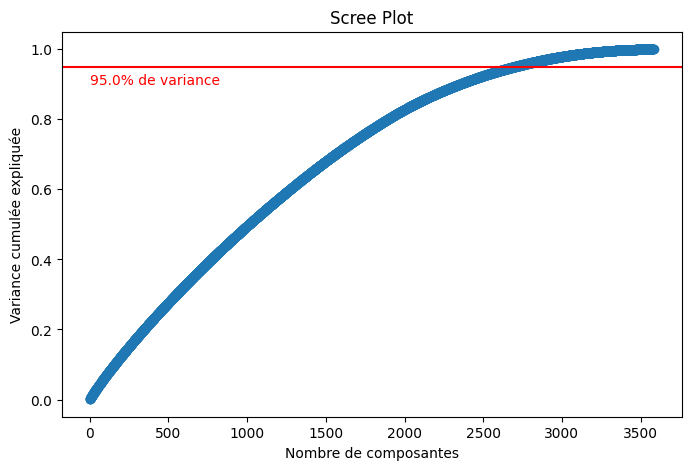

In [125]:
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 5))
plt.plot(range(1, len(cumulative_variance) + 1), cumulative_variance, marker='o', linestyle='--')
plt.xlabel('Nombre de composantes')
plt.ylabel('Variance cumulée expliquée')
plt.title('Scree Plot')
plt.axhline(y=threshold, color='r', linestyle='-')
plt.text(1, threshold - 0.05, f'{threshold*100}% de variance', color='red')
plt.show()


In [126]:
from sklearn.decomposition import PCA

# Appliquer PCA avec n_components = 2699
pca = PCA(n_components=2699)
X_reduced = pca.fit_transform(X_scaled)  # Assurez-vous que X_scaled est standardisé
print("Forme des données réduites :", X_reduced.shape)


Forme des données réduites : (3583, 2699)


In [23]:
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error

# Supposons que df_final est votre DataFrame final après encodage (avec 11 307 variables par exemple)
# et que votre cible (target) est stockée dans la colonne 'box_office_fr'
# Séparation des features et de la target
X = df_final.drop(columns=['box_office_fr'])
y = df_final['box_office_fr']

# Diviser les données en ensemble d'entraînement et de test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42)

# Appliquer PCA pour réduire la dimensionnalité
# Choisissez le nombre de composantes (par exemple, 100) ou une fraction de variance à expliquer
n_components = 2580
pca = PCA(n_components=n_components)
X_train_reduced = pca.fit_transform(X_train)
X_test_reduced = pca.transform(X_test)

# Afficher la variance cumulée expliquée pour vérifier que l'essentiel de l'information est préservé
print("Variance cumulée expliquée :", pca.explained_variance_ratio_.sum())

# Entraîner un modèle XGBoost sur les données réduites
model = XGBRegressor(n_estimators=100, max_depth=6, learning_rate=0.1, random_state=42)
model.fit(X_train_reduced, y_train)

# Prédictions et calcul du RMSE
predictions = model.predict(X_test_reduced)
rmse = mean_squared_error(y_test, predictions, squared=False)
print(f"RMSE sur l'ensemble de test : {rmse}")


KeyboardInterrupt: 

In [2]:
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.pipeline import Pipeline
from xgboost import XGBRegressor
from sklearn.metrics import root_mean_squared_error


df = pd.read_csv("xgboost_final.csv")

In [ ]:
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.pipeline import Pipeline
from xgboost import XGBRegressor
from sklearn.metrics import root_mean_squared_error

# Supposons que df_final soit votre DataFrame final avec 11 307 variables, et que la cible est 'box_office_fr'
X = df.drop(columns=['box_office_fr'])
y = df['box_office_fr']

# Séparation initiale pour disposer d'un set de test réservé (optionnel), 
# et utiliser le set d'entraînement dans la validation croisée (on peut aussi faire CV sur l'ensemble des données)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42)

# Créer un pipeline avec PCA suivi de XGBoost
pipeline = Pipeline([
    ('pca', PCA(n_components=2500)),
    ('xgb', XGBRegressor(random_state=42))
])

# Exemple de grille d'hyperparamètres pour XGBoost (et éventuellement PCA)
param_grid = {
    'xgb__n_estimators': [50, 100],
    'xgb__max_depth': [3, 4],
    'xgb__learning_rate': [0.1, 0.05]
    # Vous pouvez également tester différents n_components pour la PCA si besoin
    # 'pca__n_components': [2500, 2699, 3000]
}

# Mise en place du GridSearchCV pour la validation croisée (ici 5 folds)
grid_search = GridSearchCV(pipeline, param_grid, cv=5, scoring='neg_mean_squared_error', n_jobs=-1)
grid_search.fit(X_train, y_train)

# Affichage des meilleurs hyperparamètres
print("Meilleurs hyperparamètres :")
print(grid_search.best_params_)

# Utilisation du modèle optimisé pour prédire sur le set de test réservé
best_model = grid_search.best_estimator_
predictions = best_model.predict(X_test)
rmse = root_mean_squared_error(y_test, predictions, squared=False)
print(f"RMSE sur l'ensemble de test : {rmse}")


Tentative de Truncated VD pour alleger la base de données

In [1]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.decomposition import TruncatedSVD
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error


In [2]:
# Charger les données à partir du fichier CSV
df = pd.read_csv("xgboost_final.csv")

# Afficher les premières lignes pour voir à quoi ressemblent les données
print(df.head())


   duration  box_office_fr  box_office_us  moyenne_fr_realisateur  \
0      98.0       184052.0            0.0                792090.0   
1     137.0       413052.0     19002852.0                792090.0   
2     101.0        32288.0      1072019.0                599150.0   
3      89.0        45879.0      2229190.0                792090.0   
4     136.0        15895.0       790954.0                792090.0   

   max_moyenne      budget  release_year  release_month  release_day  \
0     783947.0  15000000.0          2025              3            5   
1    1913382.0  15000000.0          2025              3            5   
2     778222.0  15000000.0          2025              3            5   
3     792849.0   3000000.0          2025              2           26   
4    1176613.0  48000000.0          2025              2           26   

   day_of_week  ...  languages_Mandarin  languages_Norvégien  \
0            2  ...                 0.0                  0.0   
1            2  ...     

In [3]:
# Supposons que la colonne cible s'appelle "box_office_fr"
X = df.drop(columns=["box_office_fr"])
y = df["box_office_fr"]

# Afficher le nombre de colonnes pour confirmer
print("Nombre de colonnes dans X :", X.shape[1])


Nombre de colonnes dans X : 11100


In [4]:
# Diviser les données : 80% entraînement et 20% test
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

print("Taille de l'ensemble d'entraînement :", X_train.shape)
print("Taille de l'ensemble de test :", X_test.shape)


Taille de l'ensemble d'entraînement : (2866, 11100)
Taille de l'ensemble de test : (717, 11100)


In [5]:
# Créer l'objet TruncatedSVD
svd = TruncatedSVD(n_components=500, random_state=42)

# Appliquer la réduction sur l'ensemble d'entraînement
X_train_reduced = svd.fit_transform(X_train)

# Transformer l'ensemble de test avec la même SVD (important d'utiliser transform et non fit_transform)
X_test_reduced = svd.transform(X_test)

print("Forme originale de X_train :", X_train.shape)
print("Forme après réduction (X_train_reduced) :", X_train_reduced.shape)


Forme originale de X_train : (2866, 11100)
Forme après réduction (X_train_reduced) : (2866, 500)


In [10]:
from sklearn.decomposition import TruncatedSVD
import numpy as np

# Initialisation avec 2699 composantes
svd = TruncatedSVD(n_components=10, random_state=42)
X_reduced = svd.fit_transform(X_train)

explained_variance = np.sum(svd.explained_variance_ratio_)
print(f"Variance expliquée par 10 composants : {explained_variance:.2%}")


Variance expliquée par 10 composants : 100.00%


In [11]:
import numpy as np

# Convertir en array (attention si X_train est très grand)
X_train_np = X_train.to_numpy()
rank = np.linalg.matrix_rank(X_train_np)
print("Rang effectif de X_train :", rank)


Rang effectif de X_train : 2866


In [6]:
import pandas as pd
import numpy as np
from sklearn.decomposition import TruncatedSVD
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.pipeline import Pipeline
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error

# Charger vos données
# Supposons que df (par exemple, issu d'un CSV) contient 11 307 colonnes et la cible 'box_office_fr'
# df = pd.read_csv("xgboost_final.csv")  # à décommenter si besoin

X = df.drop(columns=['box_office_fr'])
y = df['box_office_fr']

# Séparation en ensembles d'entraînement (90%) et de test (10%)
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.1, random_state=42
)

# Pour limiter la charge mémoire lors de la recherche d'hyperparamètres, on peut utiliser un sous-échantillon
# Par exemple, utiliser 50% de l'ensemble d'entraînement pour le grid search
X_train_subset = X_train.sample(frac=0.5, random_state=42)
y_train_subset = y_train.loc[X_train_subset.index]

# Création d'un pipeline avec TruncatedSVD pour réduire la dimensionnalité et XGBoost pour la régression.
# Ici, on choisit n_components=100. Vous pourrez réaugmenter cette valeur si nécessaire.
pipeline = Pipeline([
    ('svd', TruncatedSVD(n_components=100, random_state=42)),
    ('xgb', XGBRegressor(random_state=42, tree_method='hist'))
])

# Définir une grille d'hyperparamètres simplifiée pour XGBoost
param_grid = {
    'xgb__n_estimators': [50, 100],
    'xgb__max_depth': [3, 4],
    'xgb__learning_rate': [0.1, 0.05]
    # Vous pouvez aussi expérimenter avec 'svd__n_components' si besoin, par exemple : [100, 150]
}

# Utiliser GridSearchCV avec 3 folds et n_jobs=1 afin de limiter la surcharge mémoire.
grid_search = GridSearchCV(pipeline, param_grid, cv=3, scoring='neg_mean_squared_error', n_jobs=1)
grid_search.fit(X_train_subset, y_train_subset)

# Afficher les meilleurs hyperparamètres trouvés
print("Meilleurs hyperparamètres :")
print(grid_search.best_params_)

# Utiliser le meilleur modèle pour faire des prédictions sur l'ensemble de test
best_model = grid_search.best_estimator_
predictions = best_model.predict(X_test)
rmse = np.sqrt(mean_squared_error(y_test, predictions))
print(f"RMSE sur l'ensemble de test : {rmse:.2f}")


Meilleurs hyperparamètres :
{'xgb__learning_rate': 0.1, 'xgb__max_depth': 4, 'xgb__n_estimators': 100}
RMSE sur l'ensemble de test : 232581.78


In [7]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.decomposition import TruncatedSVD
from sklearn.pipeline import Pipeline
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error

# Étape 1 : Charger le fichier CSV
# Remplacez le chemin par celui de votre fichier
df = pd.read_csv("xgboost_final.csv")

# Étape 2 : Filtrer pour ne conserver que les 20% des films avec le box_office_fr le plus élevé
# On calcule le 80e percentile pour définir le seuil du top 20%
seuil_top20 = df['box_office_fr'].quantile(0.80)
# On garde uniquement les films dont le box_office_fr est supérieur ou égal à ce seuil
df_top20 = df[df['box_office_fr'] >= seuil_top20].copy()
print("Nombre de films dans le top 20% :", df_top20.shape[0])

# Étape 3 : Séparer les variables explicatives et la cible
X_top20 = df_top20.drop(columns=['box_office_fr'])
y_top20 = df_top20['box_office_fr']

# Optionnel : si la distribution de la cible est très asymétrique,
# vous pouvez appliquer une transformation log pour "compresser" les valeurs extrêmes
# y_top20 = np.log1p(y_top20)

# Étape 4 : Diviser la base en ensemble d'entraînement et de test
X_train, X_test, y_train, y_test = train_test_split(
    X_top20, y_top20, test_size=0.1, random_state=42
)

# Étape 5 : Construire un pipeline avec une réduction de dimension et XGBoost
# Ici, nous utilisons TruncatedSVD pour réduire la dimension (exemple avec 200 composantes)
pipeline = Pipeline([
    ('svd', TruncatedSVD(n_components=200, random_state=42)),
    ('xgb', XGBRegressor(random_state=42, tree_method='hist'))
])

# Étape 6 : Définir une grille d'hyperparamètres pour XGBoost
param_grid = {
    'xgb__n_estimators': [50, 100],
    'xgb__max_depth': [3, 4],
    'xgb__learning_rate': [0.1, 0.05]
    # Vous pouvez également tester différents nombres de composantes en décommentant :
    # 'svd__n_components': [200, 300]
}

# Utiliser la GridSearchCV : ici on utilise 3 folds pour limiter le coût computationnel
grid_search = GridSearchCV(pipeline, param_grid, cv=3, scoring='neg_mean_squared_error', n_jobs=-1)
grid_search.fit(X_train, y_train)

print("Meilleurs hyperparamètres :")
print(grid_search.best_params_)

# Étape 7 : Évaluer le modèle sur l'ensemble de test
best_model = grid_search.best_estimator_
predictions = best_model.predict(X_test)
rmse = np.sqrt(mean_squared_error(y_test, predictions))
print(f"RMSE sur l'ensemble de test : {rmse:.2f}")


Nombre de films dans le top 20% : 717
Meilleurs hyperparamètres :
{'xgb__learning_rate': 0.05, 'xgb__max_depth': 3, 'xgb__n_estimators': 100}
RMSE sur l'ensemble de test : 408219.89
